In [ ]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
!pip install accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.6/297.6 kB 4.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
!pip install -q git+https://github.com/huggingface/peft.git transformers bitsandbytes datasets

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.8/119.8 MB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 37.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 388.9/388.9 kB 10.3 MB/s eta 0:00:00


In [ ]:
# from https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb
from datasets import load_dataset

#dataset = load_dataset("ybelkada/football-dataset", split="train")
dataset = load_dataset("garythung/trashnet")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
dataset["train"][0]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4032x3024>,
 'label': 0}

In [ ]:
# From https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb

# I think it expects there to be a ['text'] property on the data
label_dict = {
    # 0: "glass",
    # 1: "paper",
    # 2: "cardboard",
    # 3: "plastic",
    # 4: "metal",
    # 5: "miscellaneous" # trash
    0: "cardboard",
    1: "glass",
    2: "metal",
    3: "paper",
    4: "plastic",
    5: "trash"
}

# print(label_dict[dataset["train"][0]["label"]])
# dataset["train"][0]["label"] = "glass"
# print(dataset["train"][0])

# for img in dataset['train']:
#   #dataset["train"][img]["text"] = "A " + label_dict[dataset["train"][img]["label"]] + " piece of trash."
#   dataset["train"][img]["text"] = label_dict[dataset["train"][img]["label"]]
# dataset["train"][0]["text"]

def add_text(image):
    #image["text"] = 'A ' + label_dict[image["label"]] + " piece of trash."
    image["text"] = label_dict[image["label"]]
    return image

#https://huggingface.co/docs/datasets/process#map

dataset = dataset.map(add_text)

In [ ]:
dataset["train"][0]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=4032x3024>,
 'label': 0,
 'text': 'cardboard'}

In [ ]:
# From https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb
from torch.utils.data import Dataset, DataLoader

class ImageCaptioningDataset(Dataset):
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        #item = self.dataset[idx]
        item = self.dataset["train"][idx]
        encoding = self.processor(images=item["image"], padding="max_length", return_tensors="pt")
        # remove batch dimension
        encoding = {k: v.squeeze() for k, v in encoding.items()}
        encoding["text"] = item["text"]
        return encoding

def collate_fn(batch):
    # pad the input_ids and attention_mask
    processed_batch = {}
    for key in batch[0].keys():
        if key != "text":
            processed_batch[key] = torch.stack([example[key] for example in batch])
        else:
            text_inputs = processor.tokenizer(
                [example["text"] for example in batch], padding=True, return_tensors="pt"
            )
            processed_batch["input_ids"] = text_inputs["input_ids"]
            processed_batch["attention_mask"] = text_inputs["attention_mask"]
    return processed_batch

In [ ]:
# From https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb
from transformers import AutoProcessor, Blip2ForConditionalGeneration

processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained("ybelkada/blip2-opt-2.7b-fp16-sharded", device_map="auto", load_in_8bit=True)

The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.


Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

In [ ]:
# From https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb
from peft import LoraConfig, get_peft_model

# Let's define the LoraConfig
config = LoraConfig(
    r=16,
    lora_alpha=32,
    lora_dropout=0.05,
    bias="none",
    target_modules=["q_proj", "k_proj"]
)

model = get_peft_model(model, config)
model.print_trainable_parameters()

trainable params: 5,242,880 || all params: 3,749,922,816 || trainable%: 0.13981301102065136


In [ ]:
# From https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb

train_dataset = ImageCaptioningDataset(dataset, processor)
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=3, collate_fn=collate_fn)

In [ ]:
# From https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb

# trained in 3 1/2 minutes, not bad...
import torch

optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)

device = "cuda" if torch.cuda.is_available() else "cpu"

model.train()

for epoch in range(200):
  print("Epoch:", epoch)
  print(train_dataloader)
  for idx, batch in enumerate(train_dataloader):
    input_ids = batch.pop("input_ids").to(device)
    pixel_values = batch.pop("pixel_values").to(device, torch.float16)

    outputs = model(input_ids=input_ids,
                    pixel_values=pixel_values,
                    labels=input_ids)

    loss = outputs.loss

    print("Loss:", loss.item())

    loss.backward()

    optimizer.step()
    optimizer.zero_grad()

Epoch: 0
Loss: 2.2709369659423828e-05
Epoch: 1
Loss: 3.11732292175293e-05
Epoch: 2
Loss: 1.996755599975586e-05
Epoch: 3
Loss: 7.927417755126953e-06
Epoch: 4
Loss: 1.329183578491211e-05
Epoch: 5
Loss: 2.276897430419922e-05
Epoch: 6
Loss: 8.225440979003906e-06
Epoch: 7
Loss: 6.377696990966797e-06
Epoch: 8
Loss: 5.304813385009766e-06
Epoch: 9
Loss: 1.4483928680419922e-05
Epoch: 10
Loss: 4.5299530029296875e-06
Epoch: 11
Loss: 5.066394805908203e-06
Epoch: 12
Loss: 6.4373016357421875e-06
Epoch: 13
Loss: 3.2782554626464844e-06
Epoch: 14
Loss: 6.198883056640625e-06
Epoch: 15
Loss: 6.67572021484375e-06
Epoch: 16
Loss: 5.185604095458984e-06
Epoch: 17
Loss: 7.68899917602539e-06
Epoch: 18
Loss: 4.887580871582031e-06
Epoch: 19
Loss: 7.510185241699219e-06
Epoch: 20
Loss: 1.1444091796875e-05
Epoch: 21
Loss: 6.973743438720703e-06
Epoch: 22
Loss: 5.781650543212891e-06
Epoch: 23
Loss: 7.68899917602539e-06
Epoch: 24
Loss: 5.602836608886719e-06
Epoch: 25
Loss: 5.125999450683594e-06
Epoch: 26
Loss: 6.84857

In [ ]:
# Inference

DatasetDict({
    train: Dataset({
        features: ['image', 'label', 'text'],
        num_rows: 5054
    })
})


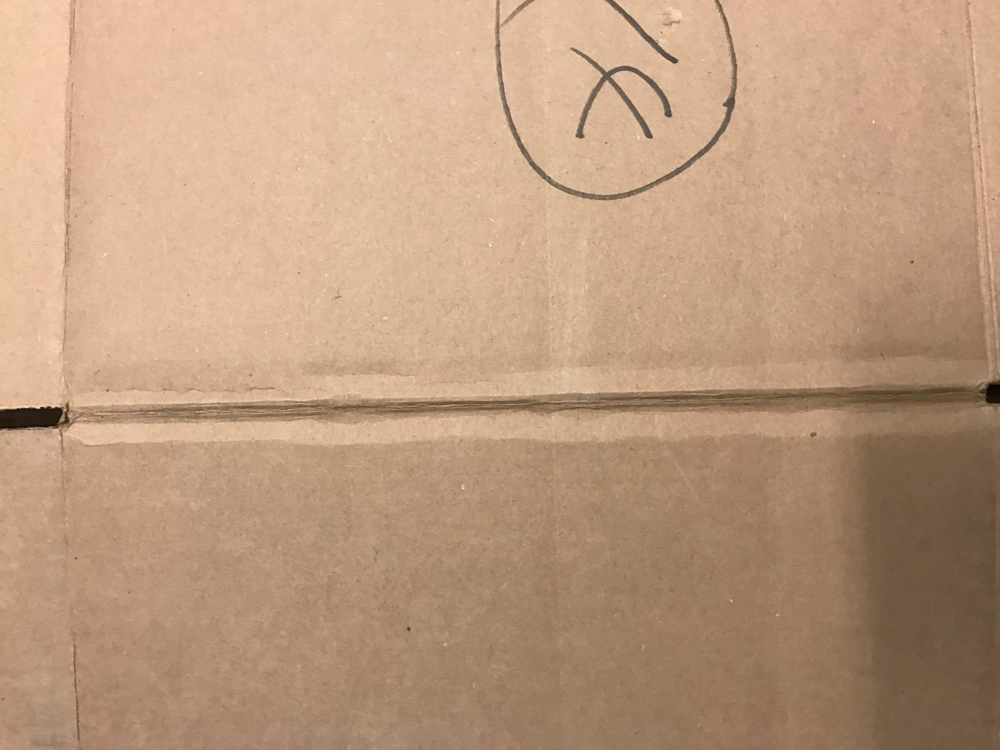

In [ ]:
# load image # or rather, the image from the TACO dataset
# just for now, testing with an image in the training set.
# I know that's not ideal, but just as a sanity check
# print(dataset)
# example = dataset["train"][0]
# image = example["image"]
# image

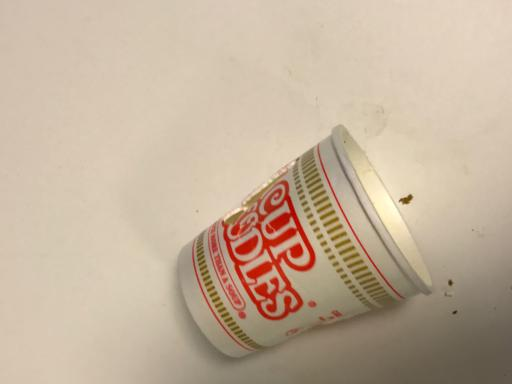

In [ ]:
# styrofoam cup o noodles
# cardboard bowl with white background - not bad. hard to visually distinguish between the two
example = dataset["train"][5000]
image = example["image"]
image

# crushed up soda can: metal
# can can of soda can with green and white background
# idea: match words in caption against supercategory names in TACO
# example = dataset["train"][1050]
# image = example["image"]
# image

# foil foil foil foil...
# example = dataset["train"][3500]
# image = example["image"]
# image

# cardboard cardboard...
# example = dataset["train"][0]
# image = example["image"]
# image

In [ ]:
# From https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb

# image 0

# prepare image for the model
inputs = processor(images=image, return_tensors="pt").to(device, torch.float16)
pixel_values = inputs.pixel_values

# max_new_tokens from error
generated_ids = model.generate(pixel_values=pixel_values, max_new_tokens=8)  #max_length=25, max_new_tokens=25
generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0].strip()
print(generated_caption)

cardboard cup with acardboard cup


In [ ]:
# OUR CODE

s = "cardboard cup with acardboard cup"

def get_class(s):
    d = {}
    words = s.split(" ")
    for word in words:
        if word in d:
            d[word] += 1
        else:
            d[word] = 1

    # print(d)
    supercategories = ["Glass", "metal", "cardboard", "paper", "trash"]
    print(supercategories)

    sorted_d = sorted(d.items(), key=lambda kv: kv[1], reverse=True)

    supercategories = [supercategories[i].lower() for i in range(len(supercategories))]
    print(supercategories)

    # print(sorted_d)
    for key, value in sorted_d:
        if key.lower() in supercategories:
            return key.lower()
    return ""

res = get_class("Cardboard cup with acardboard cup")
print(res)

['Glass', 'metal', 'cardboard', 'paper', 'trash']
['glass', 'metal', 'cardboard', 'paper', 'trash']
cardboard


In [ ]:
# # image 5000

# # prepare image for the model
# inputs = processor(images=image, return_tensors="pt").to(device, torch.float16)
# pixel_values = inputs.pixel_values

# # max_new_tokens from error
# generated_ids = model.generate(pixel_values=pixel_values, max_length=25, max_new_tokens=25)
# generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
# print(generated_caption)

Both `max_new_tokens` (=25) and `max_length`(=25) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


glass, glass, glass, glass, glass, glass, glass, glass, glass, glass, glass, glass, glass


In [ ]:
# push to Hub

In [ ]:
# from huggingface_hub import notebook_login

# notebook_login()

In [ ]:
# From https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb
# Trained model at https://huggingface.co/JoeLisk/blip2-trashnet-trash-categories

model.push_to_hub("JoeLisk/blip2-trashnet-trash-categories")
# for trashnet + taco

adapter_model.safetensors:   0%|          | 0.00/21.0M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/JoeLisk/blip2-trashnet-trash-categories/commit/f6a50db49bb90ecf7d9bf92c2da1860e09708c82', commit_message='Upload model', commit_description='', oid='f6a50db49bb90ecf7d9bf92c2da1860e09708c82', pr_url=None, pr_revision=None, pr_num=None)

In [ ]:
# load from the Hub

In [ ]:
# From From https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb

from transformers import Blip2ForConditionalGeneration, AutoProcessor
from peft import PeftModel, PeftConfig

# peft_model_id = "ybelkada/blip2-opt-2.7b-football-captions-adapters"
peft_model_id = "JoeLisk/blip2-trashnet-trash-categories"
config = PeftConfig.from_pretrained(peft_model_id)

model = Blip2ForConditionalGeneration.from_pretrained(config.base_model_name_or_path, load_in_8bit=True, device_map="auto")
model = PeftModel.from_pretrained(model, peft_model_id)

processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  # Means the user did not define a `HF_TOKEN` secret => warn


adapter_config.json:   0%|          | 0.00/780 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/7.05k [00:00<?, ?B/s]

The `load_in_4bit` and `load_in_8bit` arguments are deprecated and will be removed in the future versions. Please, pass a `BitsAndBytesConfig` object in `quantization_config` argument instead.


pytorch_model.bin.index.json:   0%|          | 0.00/122k [00:00<?, ?B/s]

pytorch_model-00001-of-00008.bin:   0%|          | 0.00/995M [00:00<?, ?B/s]

pytorch_model-00002-of-00008.bin:   0%|          | 0.00/999M [00:00<?, ?B/s]

pytorch_model-00003-of-00008.bin:   0%|          | 0.00/985M [00:00<?, ?B/s]

pytorch_model-00004-of-00008.bin:   0%|          | 0.00/997M [00:00<?, ?B/s]

pytorch_model-00005-of-00008.bin:   0%|          | 0.00/997M [00:00<?, ?B/s]

pytorch_model-00006-of-00008.bin:   0%|          | 0.00/997M [00:00<?, ?B/s]

pytorch_model-00007-of-00008.bin:   0%|          | 0.00/997M [00:00<?, ?B/s]

pytorch_model-00008-of-00008.bin:   0%|          | 0.00/782M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

adapter_model.safetensors:   0%|          | 0.00/21.0M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

In [ ]:
# checking captions on trained dataset

In [ ]:
from PIL import Image
#image = Image.open('./exampleTACOimage.jpg')
image = Image.open('./tacofinal.jpg')

Text(0.5, 1.0, 'Generated caption: cardboard table with green bottle bottle on table\n')

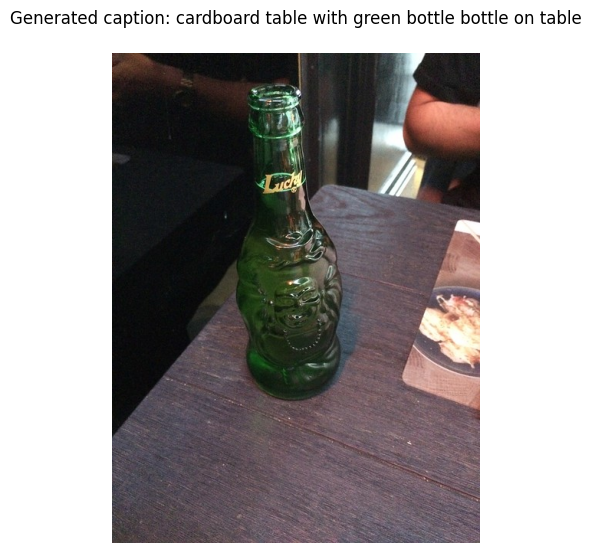

In [ ]:
# From https://github.com/huggingface/notebooks/blob/main/peft/Fine_tune_BLIP2_on_an_image_captioning_dataset_PEFT.ipynb

import torch
from matplotlib import pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

fig = plt.figure(figsize=(18, 14))

# prepare image for the model
# for i, example in enumerate(dataset):
# image = example["image"]
prompt = "Is there any trash in this picture?"
inputs = processor(images=image, prompt=prompt, return_tensors="pt").to(device, torch.float16)
#pixel_values = inputs.pixel_values

# generated_ids = model.generate(pixel_values=pixel_values, max_length=25)
generated_ids = model.generate(**inputs, max_length=25)
generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
fig.add_subplot(2, 3, 1)
plt.imshow(image)
plt.axis("off")
plt.title(f"Generated caption: {generated_caption}")

In [ ]:
# OUR CODE

# TODO, filter the caption to just the categories
# print(generated_caption)
# words = generated_caption.split(", ")
# print(words)
# for word in words:
s = generated_caption

def get_class(s):
    d = {}
    #words = s.split(", ")
    words = s.split(" ")
    for word in words:
        if word in d:
            d[word] += 1
        else:
            d[word] = 1

    supercategories = ["glass", "metal", "cardboard", "paper", "trash", "bottle"] # added bottle in - spotting it the bottle
    sorted_d = sorted(d.items(), key=lambda kv: kv[1])
    print(sorted_d)
    classes = []
    for key, value in sorted_d:
        print(key)
        print(value)
        if key in supercategories:
            classes.append(key)
    return classes

res = get_class(s)
print(res)

[('cardboard', 1), ('table', 1), ('with', 1), ('green', 1), ('on', 1), ('table\n', 1), ('bottle', 2)]
cardboard
1
table
1
with
1
green
1
on
1
table

1
bottle
2
['cardboard', 'bottle']


In [ ]:
# From https://huggingface.co/docs/transformers/en/tasks/zero_shot_object_detection

from transformers import pipeline

checkpoint = "google/owlv2-base-patch16-ensemble"
detector = pipeline(model=checkpoint, task="zero-shot-object-detection")

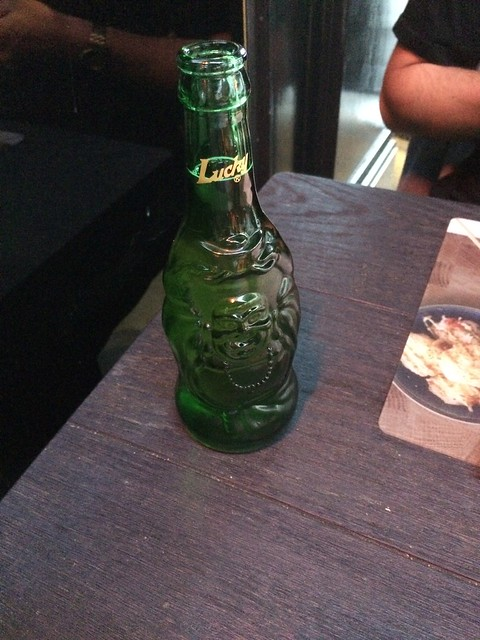

In [ ]:
# From https://huggingface.co/docs/transformers/en/tasks/zero_shot_object_detection

# import skimage
import numpy as np
from PIL import Image

# image = skimage.data.astronaut()
image = Image.fromarray(np.uint8(image)).convert("RGB")

image

In [ ]:
# From https://huggingface.co/docs/transformers/en/tasks/zero_shot_object_detection

# 30 second inference for one label
predictions = detector(
    image,
    candidate_labels=["cardboard", "bottle"], #again, spotting it the bottle
)
predictions

[{'score': 0.5660809278488159,
  'label': 'bottle',
  'box': {'xmin': 119, 'ymin': 42, 'xmax': 226, 'ymax': 456}},
 {'score': 0.13532407581806183,
  'label': 'cardboard',
  'box': {'xmin': 281, 'ymin': 217, 'xmax': 360, 'ymax': 470}}]

In [ ]:
# OUR CODE

# filter predictions: threshold: score > .30
#predictions = predictions[predictions[i]["score"] >= 0.3 for i in predictions]
new_predictions = []
for i in range(len(predictions)):
  #if predictions[i]["score"] > 0.3:
  if predictions[i]["score"] > 0.1:
    new_predictions.append(predictions[i])

new_predictions

[{'score': 0.5660809278488159,
  'label': 'bottle',
  'box': {'xmin': 119, 'ymin': 42, 'xmax': 226, 'ymax': 456}},
 {'score': 0.13532407581806183,
  'label': 'cardboard',
  'box': {'xmin': 281, 'ymin': 217, 'xmax': 360, 'ymax': 470}}]

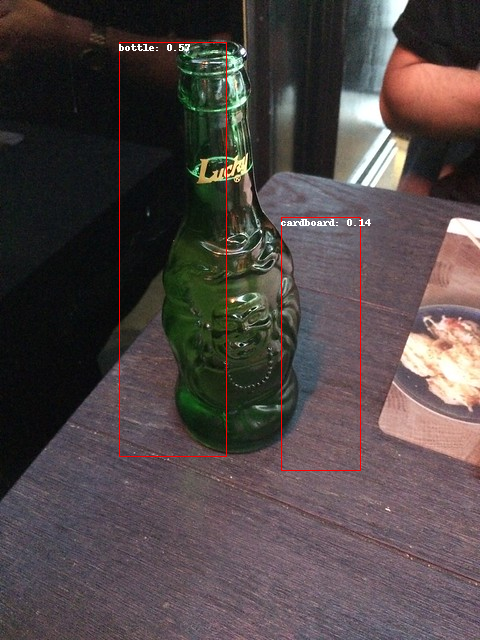

In [ ]:
# From https://huggingface.co/docs/transformers/en/tasks/zero_shot_object_detection

from PIL import ImageDraw

image_inf = image
draw = ImageDraw.Draw(image_inf)

for prediction in new_predictions:
    box = prediction["box"]
    label = prediction["label"]
    score = prediction["score"]

    xmin, ymin, xmax, ymax = box.values()
    draw.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw.text((xmin, ymin), f"{label}: {round(score,2)}", fill="white")

image_inf

In [ ]:
# From https://huggingface.co/docs/transformers/en/tasks/zero_shot_object_detection

# baseline method: OWL-ViT without labels

# with ""
# [{'score': 0.28251802921295166,
#   'label': '',
#   'box': {'xmin': 89, 'ymin': 64, 'xmax': 277, 'ymax': 388}}]

#

# future work: mention methods that could improve time complexity of VLMS (right now quadratic to query size)
# inference time for one image:
#   for one class: 30 sec
#   for 6 classes: 4 min 30

predictions = detector(
    image,
    #candidate_labels=["trash"],
    # the 6 labels in trashnet: no learning of labels from BLIP-2
    candidate_labels=["glass", "cardboard", "paper", "plastic", "metal", "trash"]
)
predictions

[{'score': 0.3228602409362793,
  'label': 'paper',
  'box': {'xmin': 283, 'ymin': 217, 'xmax': 360, 'ymax': 469}},
 {'score': 0.19119325280189514,
  'label': 'cardboard',
  'box': {'xmin': 283, 'ymin': 217, 'xmax': 360, 'ymax': 469}},
 {'score': 0.17470015585422516,
  'label': 'trash',
  'box': {'xmin': 283, 'ymin': 217, 'xmax': 360, 'ymax': 469}},
 {'score': 0.13047575950622559,
  'label': 'glass',
  'box': {'xmin': 51, 'ymin': 24, 'xmax': 82, 'ymax': 117}},
 {'score': 0.11206334084272385,
  'label': 'plastic',
  'box': {'xmin': 90, 'ymin': 36, 'xmax': 271, 'ymax': 460}}]

In [ ]:
# OUR CODE

# filter predictions: threshold: score > .30
#predictions = predictions[predictions[i]["score"] >= 0.3 for i in predictions]
new_predictions_b = []
for i in range(len(predictions)):
  if predictions[i]["score"] > 0.1:
    new_predictions_b.append(predictions[i])

new_predictions_b

[{'score': 0.3228602409362793,
  'label': 'paper',
  'box': {'xmin': 283, 'ymin': 217, 'xmax': 360, 'ymax': 469}},
 {'score': 0.19119325280189514,
  'label': 'cardboard',
  'box': {'xmin': 283, 'ymin': 217, 'xmax': 360, 'ymax': 469}},
 {'score': 0.17470015585422516,
  'label': 'trash',
  'box': {'xmin': 283, 'ymin': 217, 'xmax': 360, 'ymax': 469}},
 {'score': 0.13047575950622559,
  'label': 'glass',
  'box': {'xmin': 51, 'ymin': 24, 'xmax': 82, 'ymax': 117}},
 {'score': 0.11206334084272385,
  'label': 'plastic',
  'box': {'xmin': 90, 'ymin': 36, 'xmax': 271, 'ymax': 460}}]

In [ ]:
# baseline method: get clean image
from PIL import Image
image = Image.open('./tacofinal.jpg')

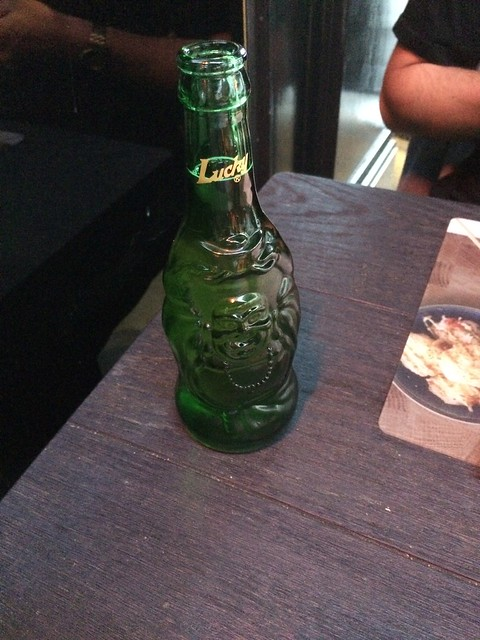

In [ ]:
# From https://huggingface.co/docs/transformers/en/tasks/zero_shot_object_detection

# import skimage
import numpy as np
from PIL import Image

# image = skimage.data.astronaut()
image = Image.fromarray(np.uint8(image)).convert("RGB")

image

[{'score': 0.5660809278488159, 'label': 'bottle', 'box': {'xmin': 119, 'ymin': 42, 'xmax': 226, 'ymax': 456}}, {'score': 0.13532407581806183, 'label': 'cardboard', 'box': {'xmin': 281, 'ymin': 217, 'xmax': 360, 'ymax': 470}}]


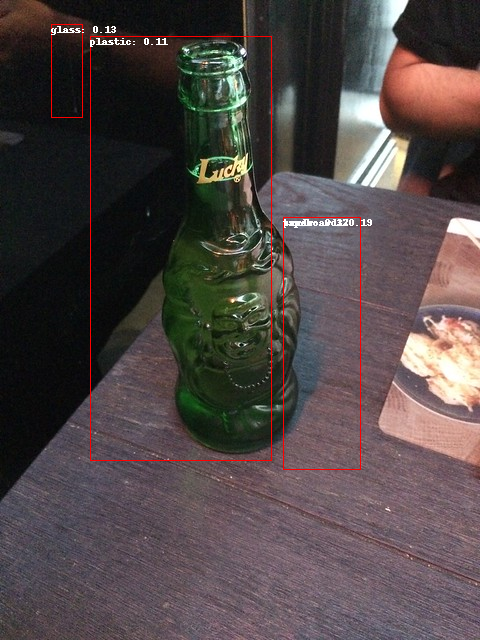

In [ ]:
# From https://huggingface.co/docs/transformers/en/tasks/zero_shot_object_detection

image_inf_copy = image
draw_copy = ImageDraw.Draw(image_inf_copy)
print(new_predictions)
for prediction in new_predictions_b:
    box = prediction["box"]
    label = prediction["label"]
    score = prediction["score"]

    xmin, ymin, xmax, ymax = box.values()
    draw_copy.rectangle((xmin, ymin, xmax, ymax), outline="red", width=1)
    draw_copy.text((xmin, ymin), f"{label}: {round(score,2)}", fill="white")

image_inf_copy

In [ ]:
#import torchvision
from torchvision.ops import box_iou
from torch import tensor

In [ ]:
# OUR CODE

# GROUND TRUTH ANNOTATIONS FROM https://raw.githubusercontent.com/pedropro/TACO/master/data/annotations.json

# code for evaluation metric
#{"id": 81, "width": 2448, "height": 3264, "file_name": "batch_1/000102.JPG", "license": null, "flickr_url": "https://farm66.staticflickr.com/65535/47803367282_a0c4d52b81_o.png", "coco_url": null, "date_captured": null, "flickr_640_url": "https://farm66.staticflickr.com/65535/47803367282_957934fcae_z.jpg"}

#new image
#{"id": 1037, "width": 2448, "height": 3264, "file_name": "batch_5/000020.JPG", "license": null, "flickr_url": "https://farm66.staticflickr.com/65535/47803970522_61bca0e46d_o.png", "coco_url": null, "date_captured": null, "flickr_640_url": "https://farm66.staticflickr.com/65535/47803970522_266895c4d2_z.jpg"}

# TODO: image dimensions don't match
# the ground truth bbox corresponds to the ORIGINAL size of the image
# while the predicted bbox corresponds to the 640x480 size of the image
# ground_truth_annotations = [
# {"id": 200, "image_id": 81, "category_id": 17, "segmentation": [[859.0, 1183.0, 838.0, 1469.0, 827.0, 1473.0, 822.0, 1496.0, 817.0, 1619.0, 829.0, 1629.0, 812.0, 1920.0, 817.0, 1929.0, 917.0, 1933.0, 919.0, 1934.0, 919.0, 1928.0, 930.0, 1928.0, 930.0, 1940.0, 932.0, 1941.0, 987.0, 1945.0, 1047.0, 1949.0, 1088.0, 1948.0, 1125.0, 1953.0, 1196.0, 1956.0, 1216.0, 1959.0, 1268.0, 1961.0, 1281.0, 1963.0, 1324.0, 1964.0, 1732.0, 1989.0, 1751.0, 1989.0, 1807.0, 1994.0, 1849.0, 1996.0, 1854.0, 1996.0, 1852.0, 1988.0, 1871.0, 1991.0, 1970.0, 1995.0, 1977.0, 1988.0, 1978.0, 1959.0, 1991.0, 1722.0, 1994.0, 1683.0, 2004.0, 1682.0, 2005.0, 1655.0, 2009.0, 1607.0, 2012.0, 1530.0, 2011.0, 1527.0, 2000.0, 1525.0, 2001.0, 1496.0, 2006.0, 1377.0, 2014.0, 1235.0, 2016.0, 1229.0, 2014.0, 1222.0, 2011.0, 1221.0, 2006.0, 1224.0, 2002.0, 1221.0, 1991.0, 1220.0, 1907.0, 1217.0, 1903.0, 1218.0, 1895.0, 1226.0, 1886.0, 1225.0, 1887.0, 1216.0, 1876.0, 1216.0, 1866.0, 1210.0, 1853.0, 1206.0, 1847.0, 1207.0, 1849.0, 1211.0, 1841.0, 1214.0, 1778.0, 1211.0, 1775.0, 1210.0, 1727.0, 1218.0, 1663.0, 1214.0, 1477.0, 1206.0, 1400.0, 1205.0, 1263.0, 1198.0, 1136.0, 1195.0, 1118.0, 1191.0, 1095.0, 1187.0, 1088.0, 1185.0, 1068.0, 1182.0, 1027.0, 1182.0, 979.0, 1180.0, 972.0, 1184.0, 964.0, 1179.0, 946.0, 1178.0, 875.0, 1171.0, 870.0, 1174.0, 858.0, 1178.0, 859.0, 1183.0]], "area": 895154.5, "bbox": [812.0, 1171.0, 1204.0, 825.0], "iscrowd": 0},
# {"id": 201, "image_id": 81, "category_id": 17, "segmentation": [[955.0, 658.0, 1054.0, 593.0, 1140.0, 537.0, 1213.0, 496.0, 1214.0, 487.0, 1238.0, 471.0, 1247.0, 468.0, 1311.0, 432.0, 1359.0, 404.0, 1387.0, 385.0, 1426.0, 359.0, 1456.0, 341.0, 1465.0, 340.0, 1471.0, 346.0, 1481.0, 346.0, 1494.0, 365.0, 1553.0, 444.0, 1559.0, 429.0, 1565.0, 422.0, 1572.0, 423.0, 1579.0, 431.0, 1606.0, 467.0, 1605.0, 478.0, 1603.0, 502.0, 1720.0, 648.0, 1775.0, 715.0, 1777.0, 702.0, 1780.0, 698.0, 1786.0, 697.0, 1800.0, 714.0, 1826.0, 747.0, 1832.0, 755.0, 1833.0, 768.0, 1837.0, 779.0, 1839.0, 788.0, 1865.0, 821.0, 1940.0, 911.0, 1947.0, 922.0, 1989.0, 1105.0, 1995.0, 1113.0, 1989.0, 1119.0, 1981.0, 1123.0, 1953.0, 1136.0, 1940.0, 1145.0, 1911.0, 1164.0, 1902.0, 1167.0, 1888.0, 1175.0, 1823.0, 1213.0, 1780.0, 1212.0, 1775.0, 1210.0, 1727.0, 1218.0, 1649.0, 1214.0, 1461.0, 1206.0, 1348.0, 1203.0, 1244.0, 1198.0, 1221.0, 1163.0, 1217.0, 1160.0, 1213.0, 1156.0, 1194.0, 1132.0, 1166.0, 1084.0, 1168.0, 1080.0, 1180.0, 1084.0, 1172.0, 1069.0, 1128.0, 993.0, 1054.0, 855.0, 1047.0, 842.0, 1040.0, 826.0, 1007.0, 779.0, 1008.0, 773.0, 968.0, 701.0, 956.0, 677.0, 957.0, 670.0, 959.0, 666.0, 955.0, 658.0]], "area": 571137.5, "bbox": [955.0, 340.0, 1040.0, 878.0], "iscrowd": 0},
# {"id": 202, "image_id": 81, "category_id": 17, "segmentation": [[1885.0, 729.0, 1927.0, 721.0, 1970.0, 720.0, 1991.0, 722.0, 1997.0, 725.0, 1997.0, 736.0, 1998.0, 745.0, 2050.0, 745.0, 2104.0, 742.0, 2144.0, 741.0, 2214.0, 738.0, 2223.0, 738.0, 2235.0, 741.0, 2247.0, 792.0, 2247.0, 800.0, 2255.0, 824.0, 2266.0, 860.0, 2265.0, 916.0, 2316.0, 1087.0, 2365.0, 1264.0, 2381.0, 1265.0, 2391.0, 1292.0, 2396.0, 1309.0, 2404.0, 1332.0, 2409.0, 1345.0, 2409.0, 1353.0, 2413.0, 1361.0, 2434.0, 1425.0, 2432.0, 1437.0, 2382.0, 1533.0, 2280.0, 1536.0, 2151.0, 1538.0, 2092.0, 1528.0, 2001.0, 1518.0, 2004.0, 1420.0, 2014.0, 1234.0, 2017.0, 1228.0, 2014.0, 1220.0, 2006.0, 1224.0, 2003.0, 1220.0, 1905.0, 1217.0, 1896.0, 1226.0, 1888.0, 1224.0, 1886.0, 1215.0, 1852.0, 1206.0, 1847.0, 1207.0, 1847.0, 1211.0, 1843.0, 1213.0, 1824.0, 1212.0, 1994.0, 1115.0, 1947.0, 923.0, 1942.0, 912.0, 1899.0, 859.0, 1861.0, 812.0, 1837.0, 786.0, 1834.0, 761.0, 1835.0, 755.0, 1873.0, 753.0, 1876.0, 741.0, 1879.0, 733.0, 1885.0, 729.0]], "area": 300483.0, "bbox": [1824.0, 720.0, 610.0, 818.0], "iscrowd": 0},
# {"id": 203, "image_id": 81, "category_id": 25, "segmentation": [[1194.0, 1887.0, 1211.0, 1887.0, 1222.0, 1892.0, 1228.0, 1900.0, 1229.0, 1917.0, 1223.0, 1928.0, 1219.0, 1935.0, 1183.0, 1934.0, 1177.0, 1918.0, 1180.0, 1895.0, 1188.0, 1888.0, 1194.0, 1887.0]], "area": 2134.5, "bbox": [1177.0, 1887.0, 52.0, 48.0], "iscrowd": 0},
# {"id": 204, "image_id": 81, "category_id": 25, "segmentation": [[1022.0, 1887.0, 1026.0, 1879.0, 1035.0, 1875.0, 1041.0, 1877.0, 1050.0, 1887.0, 1059.0, 1897.0, 1064.0, 1906.0, 1063.0, 1914.0, 1056.0, 1921.0, 1025.0, 1921.0, 1024.0, 1917.0, 1022.0, 1911.0, 1015.0, 1910.0, 1014.0, 1903.0, 1016.0, 1898.0, 1021.0, 1896.0, 1024.0, 1891.0, 1022.0, 1887.0]], "area": 1567.5, "bbox": [1014.0, 1875.0, 50.0, 46.0], "iscrowd": 0},
# {"id": 205, "image_id": 81, "category_id": 58, "segmentation": [[1195.0, 222.0, 1119.0, 262.0, 1098.0, 286.0, 1097.0, 292.0, 1203.0, 225.0, 1203.0, 222.0, 1195.0, 222.0]], "area": 1190.0, "bbox": [1097.0, 222.0, 106.0, 70.0], "iscrowd": 0}
# ]

# new image
# ground_truth_annotations = [
#   {"id": 3089, "image_id": 1037, "category_id": 18, "segmentation": [[1000.0, 1344.0, 1012.0, 1331.0, 1056.0, 1303.0, 1057.0, 1297.0, 1074.0, 1281.0, 1078.0, 1279.0, 1163.0, 1200.0, 1193.0, 1168.0, 1188.0, 1163.0, 1241.0, 1134.0, 1283.0, 1134.0, 1286.0, 1145.0, 1297.0, 1157.0, 1278.0, 1168.0, 1267.0, 1185.0, 1266.0, 1192.0, 1261.0, 1199.0, 1265.0, 1207.0, 1279.0, 1204.0, 1292.0, 1196.0, 1316.0, 1187.0, 1324.0, 1178.0, 1326.0, 1182.0, 1332.0, 1181.0, 1332.0, 1172.0, 1336.0, 1159.0, 1337.0, 1150.0, 1318.0, 1133.0, 1382.0, 1131.0, 1388.0, 1135.0, 1390.0, 1162.0, 1394.0, 1165.0, 1424.0, 1166.0, 1431.0, 1171.0, 1433.0, 1288.0, 1427.0, 1302.0, 1417.0, 1316.0, 1395.0, 1341.0, 1399.0, 1345.0, 1413.0, 1363.0, 1417.0, 1373.0, 1423.0, 1383.0, 1424.0, 1403.0, 1408.0, 1433.0, 1401.0, 1445.0, 1350.0, 1443.0, 1301.0, 1441.0, 1312.0, 1457.0, 1290.0, 1439.0, 1283.0, 1443.0, 1275.0, 1442.0, 1274.0, 1433.0, 1268.0, 1428.0, 1268.0, 1424.0, 1256.0, 1413.0, 1246.0, 1409.0, 1237.0, 1413.0, 1228.0, 1418.0, 1216.0, 1430.0, 1214.0, 1442.0, 1215.0, 1452.0, 1207.0, 1462.0, 1195.0, 1466.0, 1191.0, 1472.0, 1192.0, 1485.0, 1195.0, 1493.0, 1199.0, 1497.0, 1204.0, 1495.0, 1205.0, 1490.0, 1210.0, 1491.0, 1212.0, 1495.0, 1214.0, 1499.0, 1226.0, 1504.0, 1240.0, 1507.0, 1249.0, 1506.0, 1253.0, 1510.0, 1253.0, 1514.0, 1255.0, 1518.0, 1263.0, 1514.0, 1277.0, 1519.0, 1286.0, 1525.0, 1301.0, 1521.0, 1312.0, 1512.0, 1319.0, 1500.0, 1317.0, 1483.0, 1313.0, 1468.0, 1313.0, 1462.0, 1412.0, 1538.0, 1416.0, 1559.0, 1422.0, 1597.0, 1395.0, 1591.0, 1384.0, 1588.0, 1371.0, 1592.0, 1354.0, 1615.0, 1344.0, 1625.0, 1323.0, 1642.0, 1318.0, 1635.0, 1326.0, 1619.0, 1333.0, 1619.0, 1332.0, 1598.0, 1321.0, 1589.0, 1312.0, 1584.0, 1304.0, 1586.0, 1295.0, 1587.0, 1294.0, 1589.0, 1297.0, 1600.0, 1306.0, 1617.0, 1293.0, 1618.0, 1280.0, 1618.0, 1280.0, 1624.0, 1284.0, 1631.0, 1282.0, 1639.0, 1279.0, 1646.0, 1296.0, 1660.0, 1297.0, 1667.0, 1300.0, 1677.0, 1303.0, 1683.0, 1322.0, 1687.0, 1333.0, 1688.0, 1341.0, 1692.0, 1349.0, 1685.0, 1349.0, 1679.0, 1380.0, 1652.0, 1379.0, 1644.0, 1422.0, 1606.0, 1429.0, 1648.0, 1438.0, 1709.0, 1440.0, 1740.0, 1429.0, 1740.0, 1449.0, 1759.0, 1450.0, 1769.0, 1444.0, 1793.0, 1436.0, 1820.0, 1433.0, 1829.0, 1431.0, 1834.0, 1436.0, 1842.0, 1471.0, 1854.0, 1529.0, 1877.0, 1535.0, 1880.0, 1539.0, 1888.0, 1538.0, 1905.0, 1538.0, 1926.0, 1541.0, 1947.0, 1545.0, 1960.0, 1549.0, 1971.0, 1550.0, 1996.0, 1551.0, 2007.0, 1554.0, 2010.0, 1549.0, 2025.0, 1541.0, 2030.0, 1536.0, 2031.0, 1516.0, 2023.0, 1511.0, 2021.0, 1523.0, 2020.0, 1536.0, 2002.0, 1533.0, 1995.0, 1530.0, 1989.0, 1525.0, 1986.0, 1499.0, 1992.0, 1482.0, 1995.0, 1478.0, 2004.0, 1481.0, 2010.0, 1457.0, 2001.0, 1347.0, 1961.0, 1342.0, 1959.0, 1339.0, 1955.0, 1339.0, 1947.0, 1387.0, 1804.0, 1306.0, 1776.0, 1306.0, 1762.0, 1298.0, 1763.0, 1295.0, 1767.0, 1290.0, 1768.0, 1283.0, 1762.0, 1281.0, 1760.0, 1244.0, 1787.0, 1237.0, 1786.0, 1226.0, 1777.0, 1211.0, 1763.0, 1189.0, 1746.0, 1175.0, 1738.0, 1152.0, 1724.0, 1107.0, 1690.0, 1101.0, 1681.0, 1095.0, 1673.0, 1102.0, 1662.0, 1114.0, 1633.0, 1124.0, 1603.0, 1099.0, 1610.0, 1126.0, 1589.0, 1136.0, 1574.0, 1143.0, 1551.0, 1140.0, 1528.0, 1130.0, 1508.0, 1112.0, 1490.0, 1093.0, 1483.0, 1092.0, 1477.0, 1083.0, 1380.0, 1054.0, 1385.0, 1033.0, 1387.0, 995.0, 1388.0, 959.0, 1386.0, 974.0, 1376.0, 975.0, 1372.0, 980.0, 1363.0, 984.0, 1350.0, 1000.0, 1344.0]], "area": 203680.0, "bbox": [959.0, 1131.0, 595.0, 900.0], "iscrowd": 0},
#   {"id": 3090, "image_id": 1037, "category_id": 36, "segmentation": [[960.0, 1386.0, 949.0, 1394.0, 978.0, 1396.0, 980.0, 1402.0, 1002.0, 1405.0, 1011.0, 1412.0, 1009.0, 1424.0, 1028.0, 1437.0, 1048.0, 1451.0, 1069.0, 1468.0, 1078.0, 1472.0, 1076.0, 1479.0, 1062.0, 1486.0, 1058.0, 1494.0, 1040.0, 1498.0, 1014.0, 1509.0, 984.0, 1512.0, 954.0, 1514.0, 1064.0, 1582.0, 1067.0, 1596.0, 1060.0, 1604.0, 1066.0, 1610.0, 1075.0, 1609.0, 1092.0, 1609.0, 1111.0, 1606.0, 1126.0, 1596.0, 1128.0, 1584.0, 1136.0, 1572.0, 1142.0, 1552.0, 1142.0, 1536.0, 1138.0, 1521.0, 1130.0, 1507.0, 1119.0, 1497.0, 1108.0, 1489.0, 1093.0, 1482.0, 1091.0, 1479.0, 1087.0, 1426.0, 1084.0, 1383.0, 1072.0, 1382.0, 1056.0, 1385.0, 1021.0, 1388.0, 1006.0, 1389.0, 993.0, 1388.0, 960.0, 1386.0]], "area": 18950.0, "bbox": [949.0, 1382.0, 193.0, 228.0], "iscrowd": 0},
#   {"id": 3091, "image_id": 1037, "category_id": 42, "segmentation": [[1518.0, 2457.0, 1755.0, 2468.0, 1762.0, 2524.0, 1764.0, 2539.0, 1767.0, 2611.0, 1767.0, 2666.0, 1765.0, 2681.0, 1758.0, 2724.0, 1760.0, 2731.0, 1763.0, 2753.0, 1765.0, 2793.0, 1749.0, 2808.0, 1747.0, 2818.0, 1740.0, 2826.0, 1741.0, 2845.0, 1665.0, 2838.0, 1664.0, 2850.0, 1655.0, 2850.0, 1649.0, 2860.0, 1649.0, 2864.0, 1636.0, 2868.0, 1623.0, 2869.0, 1618.0, 2872.0, 1590.0, 2873.0, 1586.0, 2875.0, 1570.0, 2878.0, 1566.0, 2883.0, 1548.0, 2883.0, 1540.0, 2882.0, 1519.0, 2883.0, 1502.0, 2878.0, 1495.0, 2872.0, 1466.0, 2851.0, 1437.0, 2830.0, 1427.0, 2833.0, 1415.0, 2832.0, 1414.0, 2827.0, 1407.0, 2818.0, 1404.0, 2815.0, 1397.0, 2816.0, 1394.0, 2819.0, 1382.0, 2821.0, 1377.0, 2821.0, 1381.0, 2830.0, 1357.0, 2829.0, 1308.0, 2826.0, 1254.0, 2822.0, 1241.0, 2822.0, 1245.0, 2792.0, 1247.0, 2752.0, 1248.0, 2722.0, 1252.0, 2703.0, 1251.0, 2690.0, 1248.0, 2628.0, 1243.0, 2615.0, 1248.0, 2609.0, 1251.0, 2527.0, 1250.0, 2458.0, 1252.0, 2449.0, 1321.0, 2450.0, 1327.0, 2461.0, 1332.0, 2468.0, 1339.0, 2472.0, 1349.0, 2473.0, 1362.0, 2480.0, 1376.0, 2476.0, 1391.0, 2474.0, 1396.0, 2462.0, 1403.0, 2460.0, 1405.0, 2452.0, 1518.0, 2457.0]], "area": 198498.0, "bbox": [1241.0, 2449.0, 526.0, 434.0], "iscrowd": 0},
#   {"id": 3092, "image_id": 1037, "category_id": 58, "segmentation": [[1797.0, 2670.0, 1834.0, 2654.0, 1835.0, 2649.0, 1850.0, 2635.0, 1860.0, 2643.0, 1872.0, 2647.0, 1891.0, 2659.0, 1894.0, 2664.0, 1892.0, 2703.0, 1893.0, 2723.0, 1890.0, 2727.0, 1884.0, 2746.0, 1879.0, 2746.0, 1871.0, 2739.0, 1871.0, 2724.0, 1864.0, 2728.0, 1856.0, 2728.0, 1849.0, 2722.0, 1848.0, 2716.0, 1839.0, 2716.0, 1825.0, 2708.0, 1803.0, 2693.0, 1801.0, 2690.0, 1808.0, 2690.0, 1820.0, 2699.0, 1835.0, 2702.0, 1844.0, 2702.0, 1849.0, 2693.0, 1845.0, 2687.0, 1838.0, 2684.0, 1830.0, 2684.0, 1827.0, 2681.0, 1821.0, 2674.0, 1813.0, 2676.0, 1808.0, 2681.0, 1803.0, 2679.0, 1800.0, 2678.0, 1797.0, 2670.0]], "area": 5443.0, "bbox": [1797.0, 2635.0, 97.0, 111.0], "iscrowd": 0}
# ]

# final image
ground_truth_annotations = [
  {"id": 1, "image_id": 0, "category_id": 6, "segmentation": [[561.0, 1238.0, 568.0, 1201.0, 567.0, 1175.0, 549.0, 1127.0, 538.0, 1089.0, 519.0, 1043.0, 517.0, 1005.0, 523.0, 964.0, 529.0, 945.0, 520.0, 896.0, 525.0, 862.0, 536.0, 821.0, 554.0, 769.0, 577.0, 727.0, 595.0, 678.0, 596.0, 585.0, 588.0, 346.0, 581.0, 328.0, 569.0, 306.0, 570.0, 276.0, 576.0, 224.0, 560.0, 205.0, 564.0, 170.0, 578.0, 154.0, 608.0, 136.0, 649.0, 127.0, 688.0, 127.0, 726.0, 129.0, 759.0, 141.0, 784.0, 153.0, 792.0, 177.0, 788.0, 193.0, 782.0, 209.0, 792.0, 238.0, 802.0, 271.0, 802.0, 294.0, 791.0, 319.0, 789.0, 360.0, 794.0, 395.0, 810.0, 529.0, 819.0, 609.0, 841.0, 675.0, 882.0, 728.0, 916.0, 781.0, 928.0, 802.0, 938.0, 834.0, 940.0, 856.0, 939.0, 873.0, 938.0, 884.0, 944.0, 901.0, 951.0, 917.0, 956.0, 942.0, 960.0, 972.0, 964.0, 1013.0, 959.0, 1036.0, 952.0, 1081.0, 952.0, 1106.0, 934.0, 1163.0, 935.0, 1174.0, 949.0, 1209.0, 954.0, 1235.0, 952.0, 1273.0, 953.0, 1296.0, 946.0, 1320.0, 930.0, 1347.0, 914.0, 1367.0, 898.0, 1388.0, 855.0, 1419.0, 821.0, 1437.0, 769.0, 1449.0, 728.0, 1448.0, 687.0, 1439.0, 645.0, 1419.0, 618.0, 1397.0, 582.0, 1348.0, 572.0, 1314.0, 564.0, 1279.0, 561.0, 1253.0, 561.0, 1238.0]], "area": 403954.0, "bbox": [517.0, 127.0, 447.0, 1322.0], "iscrowd": 0}
]

# category id: 17
# 25
# 58
g_w = 2448
g_h = 3264
p_w = 480
p_h = 640

ratio_w = g_w / p_w
ratio_h = g_h / p_h

# TODO: need to compare the bbox attribute in ground truth with both the bounding box in the proposed and actual
prediction_dict = {}
for prediction in new_predictions:
  bbox_pred = prediction["box"] # xmin, ymin, xmax, ymax
  # print(bbox_pred)
  bbox_pred_list = [
      float(bbox_pred["xmin"]) * ratio_w,
      float(bbox_pred["ymin"]) * ratio_h,
      float(bbox_pred["xmax"]) * ratio_w,
      float(bbox_pred["ymax"]) * ratio_h
      ]
  # need to compare against every annotation in g_t_a:
  bbox_pred_tensor = tensor(bbox_pred_list).view(1, -1) * 1.0
  # print("bbox_pred_tensor:")
  # print(bbox_pred_tensor)
  # print(bbox_pred_tensor.shape)
  max_iou = 0.0
  gr_t = None
  id = None
  l = None
  for ground in ground_truth_annotations:
    bbox_gr = ground["bbox"] # xmin, ymin, width, height
    xmax_ground = bbox_gr[0] + bbox_gr[2]
    ymax_ground = bbox_gr[1] + bbox_gr[3]
    bbox_list = [float(bbox_gr[0]), float(bbox_gr[1]), float(xmax_ground), float(ymax_ground)]
    bbox_gr_tensor = tensor(bbox_list).view(1, -1) * 1.0
    # print("bbox_gr_tensor:")
    # print(bbox_gr_tensor)

    iou = box_iou(bbox_pred_tensor, bbox_gr_tensor)
    iou = float(iou[0, 0])
    if iou > max_iou:
      max_iou = iou
      gr_t = bbox_gr_tensor
      id = ground["id"]
      l = prediction["label"]

    if id in prediction_dict:
      if max_iou > prediction_dict[id][0]:
        prediction_dict[id] = [max_iou, l]
    else:
      prediction_dict[id] = [max_iou, l]

  # print("MAX + GROUND TRUTH FOR PREDICTION:")
  # print(max_iou)
  # print(gr_t)
print(prediction_dict)



baseline_dict = {}
for prediction in new_predictions_b:
  bbox_pred = prediction["box"] # xmin, ymin, xmax, ymax
  # print(bbox_pred)
  bbox_pred_list = [
      float(bbox_pred["xmin"]) * ratio_w,
      float(bbox_pred["ymin"]) * ratio_h,
      float(bbox_pred["xmax"]) * ratio_w,
      float(bbox_pred["ymax"]) * ratio_h
      ]
  # need to compare against every annotation in g_t_a:
  bbox_pred_tensor = tensor(bbox_pred_list).view(1, -1) * 1.0
  # print("bbox_pred_tensor:")
  # print(bbox_pred_tensor)
  # print(bbox_pred_tensor.shape)
  max_iou = 0.0
  gr_t = None
  id = None
  l = None
  for ground in ground_truth_annotations:
    bbox_gr = ground["bbox"] # xmin, ymin, width, height
    xmax_ground = bbox_gr[0] + bbox_gr[2]
    ymax_ground = bbox_gr[1] + bbox_gr[3]
    bbox_list = [float(bbox_gr[0]), float(bbox_gr[1]), float(xmax_ground), float(ymax_ground)]
    bbox_gr_tensor = tensor(bbox_list).view(1, -1) * 1.0
    # print("bbox_gr_tensor:")
    # print(bbox_gr_tensor)

    iou = box_iou(bbox_pred_tensor, bbox_gr_tensor)
    iou = float(iou[0, 0])
    if iou > max_iou:
      max_iou = iou
      gr_t = bbox_gr_tensor
      id = ground["id"]
      l = prediction["label"]

    if id in baseline_dict:
      if max_iou > baseline_dict[id][0]:
        baseline_dict[id] = [max_iou, l]
    else:
      baseline_dict[id] = [max_iou, l]

  # print("MAX + GROUND TRUTH FOR PREDICTION:")
  # print(max_iou)
  # print(gr_t)
print(baseline_dict)


{1: [0.33862271904945374, 'bottle'], None: [0.0, None]}
{None: [0.0, None], 1: [0.2798212170600891, 'plastic']}


In [ ]:
# OUR CODE

categories = [{"supercategory": "Aluminium foil", "id": 0, "name": "Aluminium foil"}, {"supercategory": "Battery", "id": 1, "name": "Battery"}, {"supercategory": "Blister pack", "id": 2, "name": "Aluminium blister pack"}, {"supercategory": "Blister pack", "id": 3, "name": "Carded blister pack"}, {"supercategory": "Bottle", "id": 4, "name": "Other plastic bottle"}, {"supercategory": "Bottle", "id": 5, "name": "Clear plastic bottle"}, {"supercategory": "Bottle", "id": 6, "name": "Glass bottle"}, {"supercategory": "Bottle cap", "id": 7, "name": "Plastic bottle cap"}, {"supercategory": "Bottle cap", "id": 8, "name": "Metal bottle cap"}, {"supercategory": "Broken glass", "id": 9, "name": "Broken glass"}, {"supercategory": "Can", "id": 10, "name": "Food Can"}, {"supercategory": "Can", "id": 11, "name": "Aerosol"}, {"supercategory": "Can", "id": 12, "name": "Drink can"}, {"supercategory": "Carton", "id": 13, "name": "Toilet tube"}, {"supercategory": "Carton", "id": 14, "name": "Other carton"}, {"supercategory": "Carton", "id": 15, "name": "Egg carton"}, {"supercategory": "Carton", "id": 16, "name": "Drink carton"}, {"supercategory": "Carton", "id": 17, "name": "Corrugated carton"}, {"supercategory": "Carton", "id": 18, "name": "Meal carton"}, {"supercategory": "Carton", "id": 19, "name": "Pizza box"}, {"supercategory": "Cup", "id": 20, "name": "Paper cup"}, {"supercategory": "Cup", "id": 21, "name": "Disposable plastic cup"}, {"supercategory": "Cup", "id": 22, "name": "Foam cup"}, {"supercategory": "Cup", "id": 23, "name": "Glass cup"}, {"supercategory": "Cup", "id": 24, "name": "Other plastic cup"}, {"supercategory": "Food waste", "id": 25, "name": "Food waste"}, {"supercategory": "Glass jar", "id": 26, "name": "Glass jar"}, {"supercategory": "Lid", "id": 27, "name": "Plastic lid"}, {"supercategory": "Lid", "id": 28, "name": "Metal lid"}, {"supercategory": "Other plastic", "id": 29, "name": "Other plastic"}, {"supercategory": "Paper", "id": 30, "name": "Magazine paper"}, {"supercategory": "Paper", "id": 31, "name": "Tissues"}, {"supercategory": "Paper", "id": 32, "name": "Wrapping paper"}, {"supercategory": "Paper", "id": 33, "name": "Normal paper"}, {"supercategory": "Paper bag", "id": 34, "name": "Paper bag"}, {"supercategory": "Paper bag", "id": 35, "name": "Plastified paper bag"}, {"supercategory": "Plastic bag & wrapper", "id": 36, "name": "Plastic film"}, {"supercategory": "Plastic bag & wrapper", "id": 37, "name": "Six pack rings"}, {"supercategory": "Plastic bag & wrapper", "id": 38, "name": "Garbage bag"}, {"supercategory": "Plastic bag & wrapper", "id": 39, "name": "Other plastic wrapper"}, {"supercategory": "Plastic bag & wrapper", "id": 40, "name": "Single-use carrier bag"}, {"supercategory": "Plastic bag & wrapper", "id": 41, "name": "Polypropylene bag"}, {"supercategory": "Plastic bag & wrapper", "id": 42, "name": "Crisp packet"}, {"supercategory": "Plastic container", "id": 43, "name": "Spread tub"}, {"supercategory": "Plastic container", "id": 44, "name": "Tupperware"}, {"supercategory": "Plastic container", "id": 45, "name": "Disposable food container"}, {"supercategory": "Plastic container", "id": 46, "name": "Foam food container"}, {"supercategory": "Plastic container", "id": 47, "name": "Other plastic container"}, {"supercategory": "Plastic glooves", "id": 48, "name": "Plastic glooves"}, {"supercategory": "Plastic utensils", "id": 49, "name": "Plastic utensils"}, {"supercategory": "Pop tab", "id": 50, "name": "Pop tab"}, {"supercategory": "Rope & strings", "id": 51, "name": "Rope & strings"}, {"supercategory": "Scrap metal", "id": 52, "name": "Scrap metal"}, {"supercategory": "Shoe", "id": 53, "name": "Shoe"}, {"supercategory": "Squeezable tube", "id": 54, "name": "Squeezable tube"}, {"supercategory": "Straw", "id": 55, "name": "Plastic straw"}, {"supercategory": "Straw", "id": 56, "name": "Paper straw"}, {"supercategory": "Styrofoam piece", "id": 57, "name": "Styrofoam piece"}, {"supercategory": "Unlabeled litter", "id": 58, "name": "Unlabeled litter"}, {"supercategory": "Cigarette", "id": 59, "name": "Cigarette"}]
ground_truth_labels = []

for i in range(len(ground_truth_annotations)):
  id_i = ground_truth_annotations[i]["category_id"]
  print(ground_truth_annotations[i]["bbox"])
  for c in range(len(categories)):
    if categories[c]["id"] == id_i:
      if id_i in [6, 9, 23, 26]:
        ground_truth_labels.append("glass")
      if id_i in [20, 30, 31, 32, 33, 34, 35, 56]:
        ground_truth_labels.append("paper")
      if id_i in [13, 14, 16, 17, 19]:
        ground_truth_labels.append("cardboard")
      if id_i in [4, 5, 7, 21, 24, 27, 29, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 55]:
        ground_truth_labels.append("plastic")
      if id_i in [0, 2, 8, 10, 11, 12, 28, 50, 52]:
        ground_truth_labels.append("metal")
      if id_i in [1, 3, 15, 18, 22, 25, 51, 53, 54, 57, 58, 59]:
        ground_truth_labels.append("trash")
      #label = categories[c]["supercategory"]
      #ground_truth_labels.append(label)

# glass, paper, cardboard, plastic, metal, and trash
# the id of the category mapped to the trashnet categories
# "glass": 6, 9, 23, 26
# "paper": [20, 30, 31, 32, 33, 34, 35, 56]
# "cardboard": [13, 14, 16, 17, 19]
# "plastic": [4, 5, 7, 21, 24, 27, 29, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 55]
# "metal": [0, 2, 8, 10, 11, 12, 28, 50, 52]
# "trash": [1, 3, 15, 18, 22, 25, 51, 53, 54, 57, 58, 59]


ground_truth_labels

[517.0, 127.0, 447.0, 1322.0]


['glass']

In [ ]:
# OUR CODE

# the only ground truth boxes that are represented are
# tensor([[ 812., 1171., 2016., 1996.]]) corresponds to ground_truth_label[0] = 'cardboard'
# tensor([[ 955.,  340., 1995., 1218.]]) corresponds to ground_truth_label[1] = 'cardboard'
# the detector missed all other ground truth bounding boxes for both prediction and baseline
# ground = {
#     200: 'cardboard',
#     201: 'cardboard'
# }

# ground = {
#     3089: 'trash',
#     3090: 'plastic',
#     3091: 'plastic'
# }
ground = {
    1: 'glass'
}

accuracy = 0
score = 0
for key, val in prediction_dict.items():
  label = val[1]
  if key != None:
    gt_label = ground[key]
    if label == gt_label:
      accuracy += 1

print("accuracy for prediction:")
print(accuracy / 2)

accuracy = 0
score = 0
for key, val in baseline_dict.items():
  label = val[1]
  if key != None:
    gt_label = ground[key]
    if label == gt_label:
      accuracy += 1

print("accuracy for baseline:")
print(accuracy / 2)


accuracy for prediction:
0.0
accuracy for baseline:
0.0
